<a href="https://colab.research.google.com/github/jrgee/CMPE297-98/blob/master/Dog_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [27]:
%matplotlib inline
%load_ext tensorboard
%tensorflow_version 1.x

import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPool2D, Flatten, Dense, BatchNormalization, Dropout, Activation
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import LearningRateScheduler

import numpy as np
import pandas as pd

import time
import datetime

import math
import os

import scipy.misc
from scipy.stats import itemfreq
from random import sample
import pickle

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

# Image manipulation
import PIL.Image
from IPython.display import display


print(tf.__version__)
print(tf.test.is_gpu_available())

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
2.0.0
True


## globals


In [0]:
BATCH = 32
EPOCHS = 20

## Load data

In [29]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
from os import path
if not(path.exists('/content/train')):
    print('Unzipping train.zip...')
    !unzip -q '/content/drive/My Drive/297-98/dog-breed-identification/train.zip'
    print('Unzipping test.zip...')
    !unzip -q '/content/drive/My Drive/297-98/dog-breed-identification/test.zip'
    print('finished')
else:
    print('Already loaded')

Already loaded


In [31]:
labels = pd.read_csv('/content/drive/My Drive/297-98/dog-breed-identification/labels.csv')
labels['id'] = labels['id'] + '.jpg'
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07.jpg,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97.jpg,dingo
2,001cdf01b096e06d78e9e5112d419397.jpg,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d.jpg,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62.jpg,golden_retriever


In [0]:
def main_breeds(labels_raw, Nber_breeds , all_breeds='TRUE'):
    labels_freq_pd = itemfreq(labels_raw["breed"])
    labels_freq_pd = labels_freq_pd[labels_freq_pd[:, 1].argsort()[::-1]]
    
    if all_breeds == 'FALSE':
        main_labels = labels_freq_pd[:,0][0:Nber_breeds]
    else: 
        main_labels = labels_freq_pd[:,0][:]
        
    labels_raw_np = labels_raw["breed"].as_matrix()
    labels_raw_np = labels_raw_np.reshape(labels_raw_np.shape[0],1)
    labels_filtered_index = np.where(labels_raw_np == main_labels)
    return labels_filtered_index


In [33]:
labels_filtered_index = main_breeds(labels_raw = labels, Nber_breeds = 10, all_breeds='FALSE')
labels_filtered = labels.iloc[labels_filtered_index[0],:]

print(labels_filtered.shape)
labels_filtered.head()

(1141, 2)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  # Remove the CWD from sys.path while we load stuff.


,id,breed
8,003df8b8a8b05244b1d920bb6cf451f9.jpg,basenji
9,0042188c895a2f14ef64a918ed9c7b64.jpg,scottish_deerhound
12,00693b8bc2470375cc744a6391d397ec.jpg,maltese_dog
57,0162b3e0144fb1d1ab82fbff3ace9938.jpg,shih-tzu
70,01b36cb1b80ab8c3a7d2b7128ad21bdc.jpg,samoyed


In [34]:
labels = labels_filtered
NUM_CLASSES = len(labels['breed'].unique())

imagegen = ImageDataGenerator(
    rescale=1./255,
    zoom_range=.1,
    width_shift_range=.1,
    height_shift_range=.1,
    rotation_range=30,
    horizontal_flip=True,
    validation_split=.2
    )

train_generator = imagegen.flow_from_dataframe(
    dataframe=labels,
    directory='/content/train',
    x_col='id',
    y_col='breed',
    class_mode='categorical',
    target_size=(224,224),
    subset='training',
    batch_size=BATCH)

val_generator = imagegen.flow_from_dataframe(
    dataframe=labels,
    directory='/content/train',
    x_col='id',
    y_col='breed',
    class_mode='categorical',
    target_size=(224,224),
    subset='validation',
    batch_size=BATCH)


Found 913 validated image filenames belonging to 10 classes.
Found 228 validated image filenames belonging to 10 classes.


[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


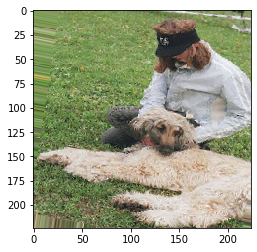

[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]


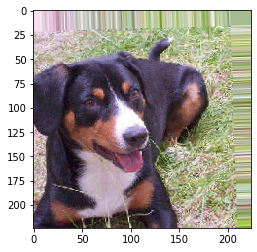

[0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]


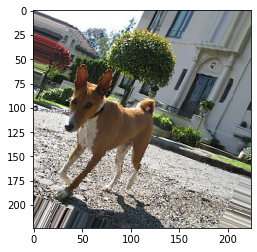

In [35]:
x,y = train_generator.next()

#show 3 sample images from the generator
for i in range(3):
    plt.imshow(x[i])
    print(y[i])
    plt.show()

## load a prebuilt model

Here, I use vgg16 used for ImageNet and add my own dense layers at the end of the model. The convolutional layers are frozen so the imagenet weights will not change during training. 

In [0]:
# tf.keras.backend.clear_session()

# imagenet_vgg = keras.applications.VGG16(include_top=False, weights='imagenet', input_shape=(224,224,3))
# imagenet_vgg.trainable = False

# model = keras.Sequential(
#     [imagenet_vgg,
#     keras.layers.GlobalAveragePooling2D(),
#     keras.layers.Dense(units=NUM_CLASSES, activation='softmax')])

# opt = Adam(lr=0.001)

# model.compile(
#     optimizer=opt,
#     loss=keras.losses.categorical_crossentropy, 
#     metrics=['accuracy'],
#     )

# model.summary()

In [37]:
tf.keras.backend.clear_session()

resnet = keras.applications.ResNet50V2(include_top=False, weights='imagenet', input_shape=(224,224,3))
resnet.trainable=False

model = keras.Sequential([
    resnet, 
    keras.layers.GlobalAveragePooling2D(),
    # keras.layers.Dense(512, activation='relu'),
    # keras.layers.Dropout(.5),
    # keras.layers.Dense(256, activation='relu'),
    # keras.layers.Dropout(.5),
    keras.layers.Dense(NUM_CLASSES, activation='softmax')])

model.compile(
    optimizer='adam', 
    loss=keras.losses.categorical_crossentropy, 
    metrics=['accuracy'])

model.summary()

94674944/94668760 [==============================] - 7s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Model)           (None, 7, 7, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 10)                20490     
Total params: 23,585,290
Trainable params: 20,490
Non-trainable params: 23,564,800
_________________________________________________________________


In [38]:
print(len(model.trainable_weights))

2


## Callbacks

In [0]:
def step_decay(epoch):
   initial_lrate = 0.01
   drop = 0.5
   epochs_drop = 10.0
   lrate = initial_lrate * math.pow(drop,  
           math.floor((1+epoch)/epochs_drop))
   return max(lrate, 0.001)

lr_callback = LearningRateScheduler(step_decay)

In [0]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

callbacks = []

## Tensorboard output

In [0]:
# %tensorboard --logdir logs

## Train model

In [42]:
start = time.time()

history = model.fit_generator(
    generator=train_generator,
    epochs=EPOCHS,
    steps_per_epoch=len(train_generator),
    validation_data=val_generator,
    validation_steps=len(val_generator),
    callbacks=callbacks
)

print('Took ' + str((time.time()-start)/60) + ' minutes') 

Epoch 1/20
29/29 [==============================] - 35s 1s/step - loss: 1.6609 - accuracy: 0.4315 - val_loss: 0.6329 - val_accuracy: 0.7763
Epoch 2/20
29/29 [==============================] - 32s 1s/step - loss: 0.7787 - accuracy: 0.7777 - val_loss: 0.3707 - val_accuracy: 0.8553
Epoch 3/20
29/29 [==============================] - 32s 1s/step - loss: 0.5680 - accuracy: 0.8434 - val_loss: 0.3960 - val_accuracy: 0.8640
Epoch 4/20
29/29 [==============================] - 32s 1s/step - loss: 0.4739 - accuracy: 0.8587 - val_loss: 0.2795 - val_accuracy: 0.8991
Epoch 5/20
29/29 [==============================] - 32s 1s/step - loss: 0.4474 - accuracy: 0.8609 - val_loss: 0.5102 - val_accuracy: 0.8860
Epoch 6/20
29/29 [==============================] - 32s 1s/step - loss: 0.4013 - accuracy: 0.8839 - val_loss: 0.4186 - val_accuracy: 0.8860
Epoch 7/20
29/29 [==============================] - 32s 1s/step - loss: 0.3709 - accuracy: 0.8861 - val_loss: 0.4322 - val_accuracy: 0.8991
Epoch 8/20
29/29 [==

In [0]:
# model.save('30_e.h5')
# new_model = tf.keras.models.load_model('30_e.h5')
# new_model.summary()

## Model Visualizations

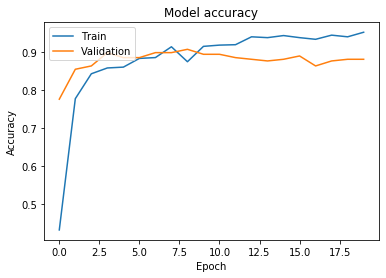

In [44]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


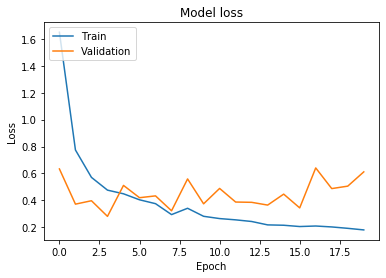

In [45]:
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## Resnet portion visualization

In [46]:
model.layers[0].summary()
# the first 2 conv layers
for layer in model.layers[0].layers[:12]:
    print(layer.name)

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

In [0]:
resnet_outputs = [layer.output for layer in model.layers[0].layers[:]]

activation_model = keras.models.Model(inputs=resnet.input, outputs=resnet_outputs)

(224, 224, 3)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]


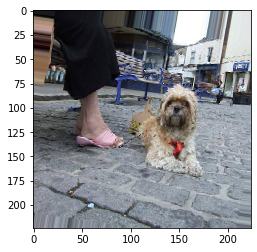

In [55]:
x,y = val_generator.next()

img = x[0]
label = y[0]
print(img.shape)

plt.imshow(img)
print(label)
plt.show()

In [56]:
img = img.reshape((1, 224, 224, 3))
activations = activation_model.predict(img)

for x in activations:
    print(x.shape)

(1, 224, 224, 3)
(1, 230, 230, 3)
(1, 112, 112, 64)
(1, 114, 114, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 58, 58, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 58, 58, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 58, 58, 64)
(1, 28, 28, 64)
(1, 28, 28, 64)
(1, 28, 28, 64)
(1, 28, 28, 256)
(1, 28, 28, 256)
(1, 28, 28, 256)
(1, 28, 28, 256)
(1, 28, 28, 256)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 30, 30, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 30, 30, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1

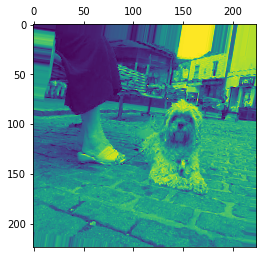

In [57]:
plt.matshow(activations[0][0, :, :, 0], cmap='viridis')
plt.show()

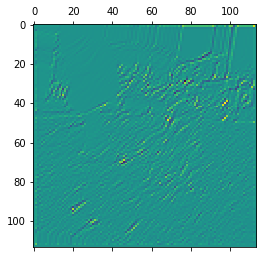

In [58]:
plt.matshow(activations[3][0, :, :, 13], cmap='viridis')


['conv2_block1_out', 'conv2_block2_out', 'conv2_block3_out', 'conv3_block1_out', 'conv3_block2_out', 'conv3_block3_out', 'conv3_block4_out', 'conv4_block1_out', 'conv4_block2_out', 'conv4_block3_out', 'conv4_block4_out', 'conv4_block5_out', 'conv4_block6_out', 'conv5_block1_out', 'conv5_block2_out', 'conv5_block3_out']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


RuntimeError: ignored

<Figure size 1152x0 with 1 Axes>

RuntimeError: ignored

<Figure size 1152x0 with 1 Axes>

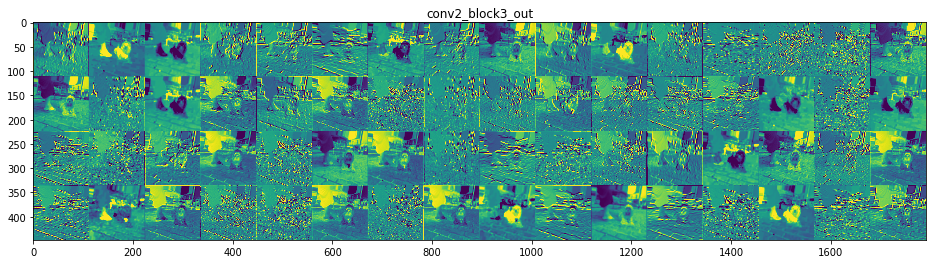

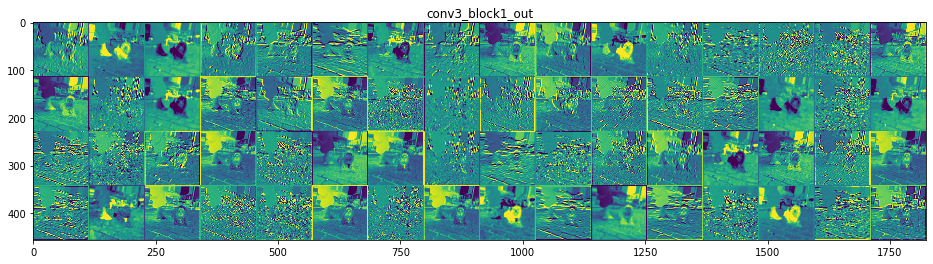

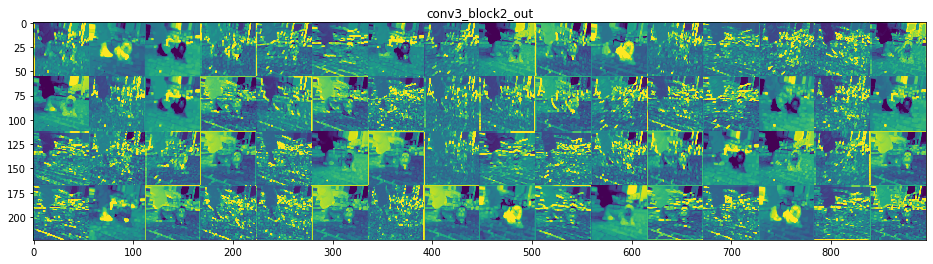

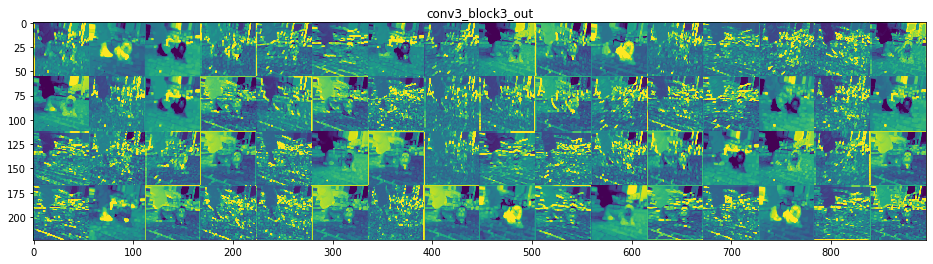

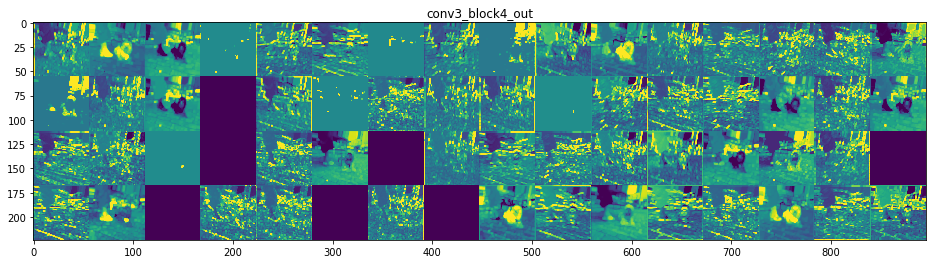

...

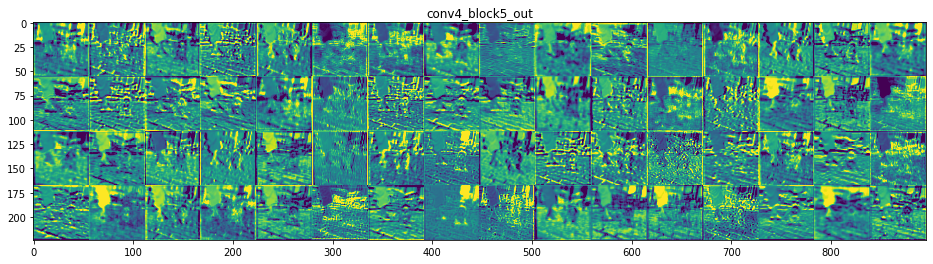

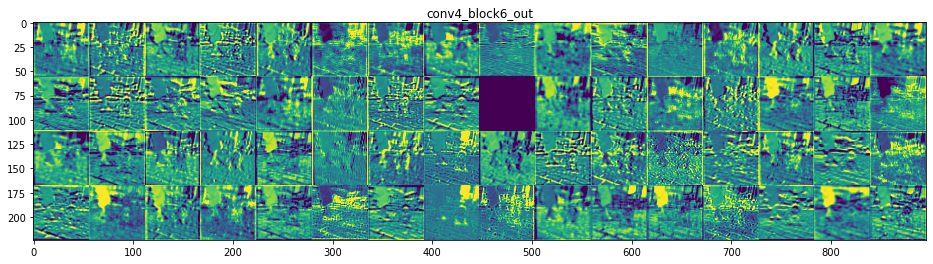

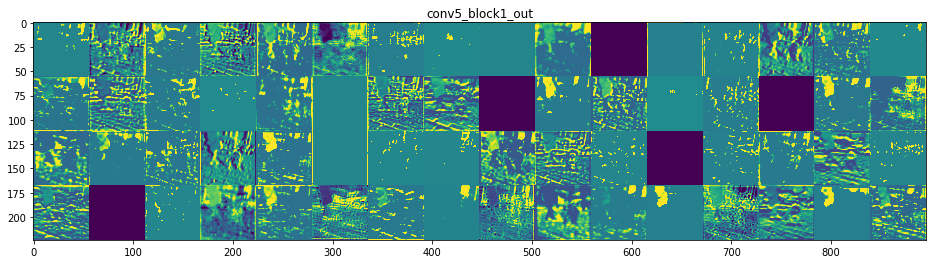

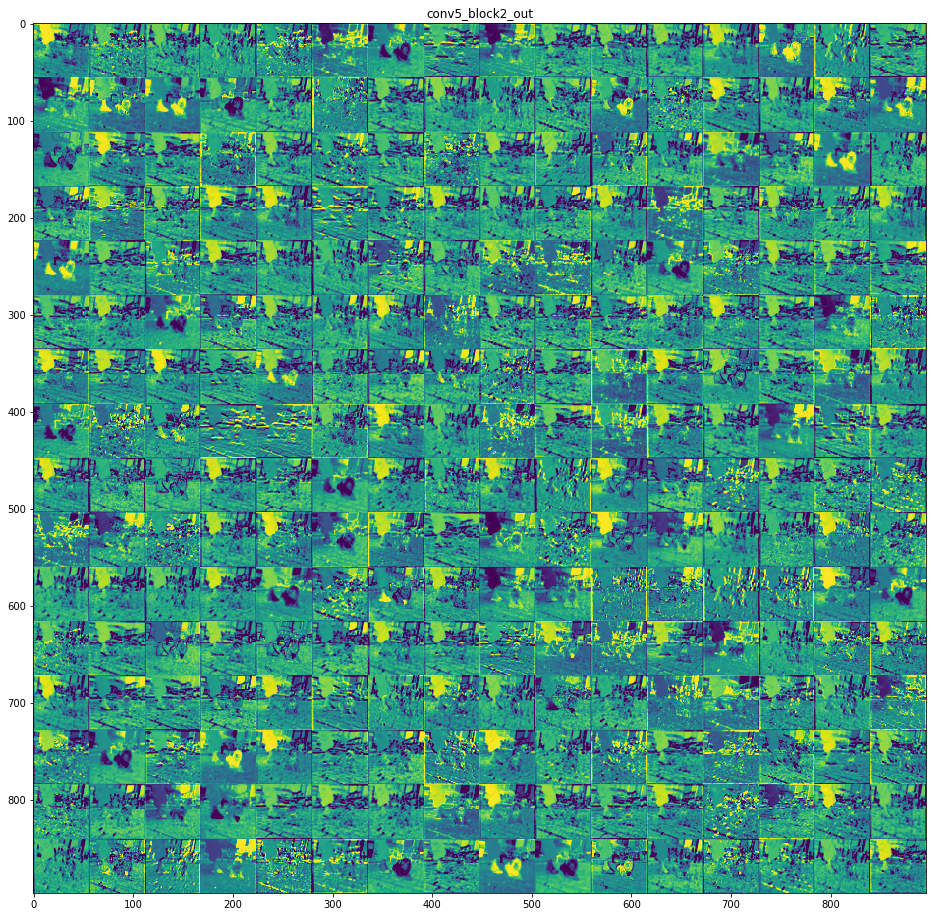

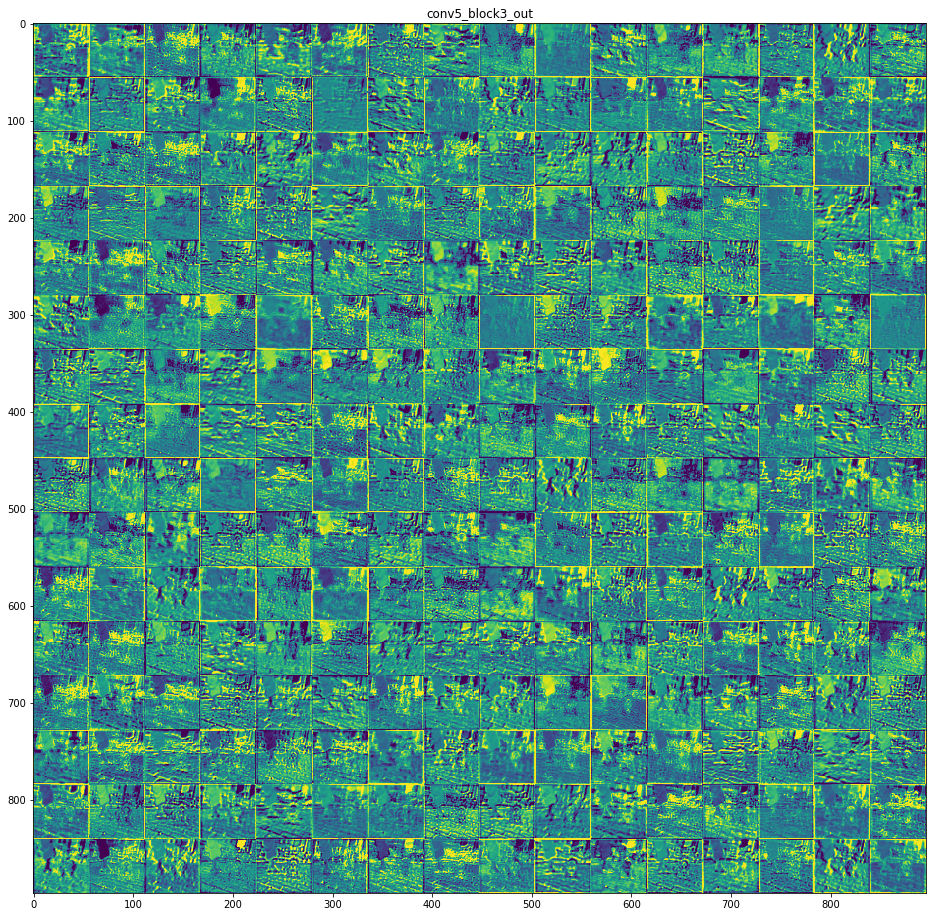

In [60]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in resnet.layers[:]:
    if('out' in layer.name):
        layer_names.append(layer.name)

print(layer_names)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()